<a href="https://colab.research.google.com/github/yvarnava/CP8307-Semantic-Segmentation-Project/blob/main/CP8307-Semantic-Segmentation-Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports

First, all dependencies are imported into the python environment.

In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.utils import plot_model
from tensorflow.data import Dataset

import PIL
import PIL.Image

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import datetime, os
import random
from pprint import pprint

tf.__version__

'2.7.0'

## Check for GPU Runtime (Optional)
This is an optional cell to check for GPU availability.

In [3]:
# check that GPU runtime is enabled
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [7]:
!nvidia-smi

Sat Dec 18 19:18:40 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P0    58W / 149W |    145MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Kaggle API Import (Optional)
If the user does not have the dataset downloaded to their local drive, they can fetch the dataset from Kaggle.

In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download crowww/a-large-scale-fish-dataset
! unzip /content/a-large-scale-fish-dataset.zip

## Load Dataset - Fish
This section loads the dataset from a local path into a pandas DataFrame which contains the path to the images and ground truth segmentation masks. The class of fish is also included but not needed for the scope of this project.

In [ ]:
# ds_path = '/content/Fish_Dataset/Fish_Dataset'

# Load from Google Drive
ds_path = '/content/drive/MyDrive/School/Masters/F2021/CP8307/Final Project/U-Net_YV_Fish/Fish_Dataset'

Append image and mask paths to a pandas DataFrame.

In [ ]:
# Initialize list for image path, mask path, and class.
ds_data = []
ds_mask = []
ds_class = []
classes = [dir for dir in os.listdir(ds_path) if os.path.isdir(os.path.join(ds_path, dir))]
for c in classes:
    for file in os.listdir(os.path.join(ds_path, c, c)):
        ds_data.append(os.path.join(ds_path, c, c, file))
        ds_mask.append(os.path.join(ds_path, c, c + ' GT', file))
        ds_class.append(c)

In [ ]:
len(classes)

9

In [ ]:
df = pd.DataFrame({'ds_data' : ds_data, 'ds_mask' : ds_mask, 'class' : ds_class})
df

,ds_data,ds_mask,class
0,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Black Sea Sprat
1,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Black Sea Sprat
2,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Black Sea Sprat
3,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Black Sea Sprat
4,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Black Sea Sprat
...,...,...,...
8995,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Trout
8996,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Trout
8997,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Trout
8998,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Trout


## Preprocess Fish Data

In [ ]:
# Get image size from test image
import pathlib
ds_path = pathlib.Path(ds_path)
fish = list(ds_path.glob('Black Sea Sprat/Black Sea Sprat/*'))
im1 = PIL.Image.open(str(fish[0]))
width, height = im1.size

IMSIZE = (width,height)
IMSIZE

(590, 445)

### Define Functions for Preprocessing

Next, two prepreprocessing functions are defined to prepare the dataset.

First, ***preprocess_fish_data(fish_path, mask_path)*** is implemented to read in the images as a 3-channel .JPEG from the path. The image is then resized to 128x128 in order to follow the input format that the U-Net expects. Finally, the image is normalized such that the intensity values are between zero and one. 

After the images are read in, the preprocessing function reads in the segmentation masks. The preprocessing steps are similar to those applied to the images, but some differences exist. For example, the image as read in as a single channel. Since the masks are binary images, there is no need for three colour channels. The image is then resized and normalized such that the intensity values are between zero and one. 

The second function, ***create_dataset(df, train = False)*** converts a DataFrame into a TensorFlow Dataset object which can be used as an input to a model. This function applies the ***preprocess_fish_data*** function after the DataFrame is converted to a TensorFlow Dataset object.

In [ ]:
# Preprocessing functions based on https://www.kaggle.com/dikshabhati2002/image-segmentation-u-net

new_im_size = [128,128]
def preprocess_fish_data(fish_path, mask_path):
  fish_img = tf.io.read_file(fish_path) # Read in JPEG of fish from path.
  fish_img = tf.image.decode_jpeg(fish_img, channels=3) # decode JPEG-encoded image to a uint8 tensor.
  fish_img = tf.image.resize(fish_img, new_im_size) # resize image to match U-Net expectation (128x128)
  fish_img = tf.cast(fish_img, tf.float32) / 255.0 # normalize image
    
  mask_img = tf.io.read_file(mask_path) # Read in JPEG of mask from path.
  mask_img = tf.image.decode_jpeg(mask_img, channels=1) # decode JPEG-encoded image to a uint8 tensor.
  mask_img = tf.image.resize(mask_img, new_im_size) # resize image to match U-Net expectation (128x128)
  mask_img = mask_img[:,:,:1] # mask is binary: take one channel only
  mask_img = tf.math.sign(mask_img) # normalize image
    
  return fish_img, mask_img
  
def create_dataset(df, train = False):
  if not train:
      # testing set
      ds = tf.data.Dataset.from_tensor_slices((df["ds_data"].values, df["ds_mask"].values)) # create TF dataset for test
      ds = ds.map(preprocess_fish_data, tf.data.AUTOTUNE) # preprocess TF dataset
  else:
      # training set - includes augmentation
      ds = tf.data.Dataset.from_tensor_slices((df["ds_data"].values, df["ds_mask"].values)) # create TF dataset for train
      ds = ds.map(preprocess_fish_data, tf.data.AUTOTUNE) # preprocess TF dataset
      # augmentation not required - done in dataset itself. Could augment here if needed.

  return ds

### Create Train, Test split (80/20)

The Scikit-Learn library was used to split the dataset into training and testing set. The training set is composed of 80% of samples while the testing set is composed of the remaining 20% of examples. Also, a random_state of 37 was used to produce repeatable dataset splits if this function was called multiple times. This helped ensure consistency in the testing set used in comparisons of other models.

In [ ]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df, random_state=37, test_size=0.2)

In [ ]:
df_train

,ds_data,ds_mask,class
7106,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Striped Red Mullet
3380,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Red Mullet
1446,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Gilt-Head Bream
2304,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Hourse Mackerel
3532,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Red Mullet
...,...,...,...
5795,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Sea Bass
4118,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Red Sea Bream
988,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Black Sea Sprat
4459,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Red Sea Bream


In [ ]:
df_test

,ds_data,ds_mask,class
7472,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Striped Red Mullet
6459,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Shrimp
4760,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Red Sea Bream
5182,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Sea Bass
5588,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Sea Bass
...,...,...,...
4857,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Red Sea Bream
316,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Black Sea Sprat
3152,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Red Mullet
5157,/content/drive/MyDrive/School/Masters/F2021/CP...,/content/drive/MyDrive/School/Masters/F2021/CP...,Sea Bass


In [ ]:
train = create_dataset(df_train, train = True)
test = create_dataset(df_test)

In [ ]:
train

<ParallelMapDataset shapes: ((128, 128, 3), (128, 128, 1)), types: (tf.float32, tf.float32)>

In [ ]:
test

<ParallelMapDataset shapes: ((128, 128, 3), (128, 128, 1)), types: (tf.float32, tf.float32)>

### Export Test set as .zip (Optional)

The purpose of this section was to extract the samples used in the randomly selected test set that contains 20% of total samples. When comparing segmentation models, it is important to compare the same images for a fair comparison.

In [ ]:
# Save test set images in separate directory
import cv2
from google.colab.patches import cv2_imshow
import os

image_path = "/content/test_images"
mask_path = "/content/test_masks"

os.mkdir(image_path)
os.mkdir(mask_path)

def get_image_file_name(path):
  imFileName = os.path.basename(os.path.normpath(path))
  return imFileName

def export_test_set_image(df_test):
  i = 1
  for im in df_test['ds_data']:
    print(f"on count {i}\n")
    # TEST IMAGE
    test_image = cv2.imread(im, cv2.IMREAD_UNCHANGED)
    test_image_name = str(i) + "_" + get_image_file_name(im)
    #SAVE IMAGE
    cv2.imwrite(os.path.join(image_path, test_image_name), test_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    i = i + 1

def export_test_set_mask(df_test):
  i = 1
  for mask in df_test['ds_mask']:
    print(f"on count {i}\n")
    # TEST MASK
    test_mask = cv2.imread(mask, cv2.IMREAD_UNCHANGED)
    test_mask_name = str(i) + "_" + get_image_file_name(mask)
    #SAVE MASK
    cv2.imwrite(os.path.join(mask_path, test_mask_name), test_mask)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    i = i + 1


In [ ]:
export_test_set_image(df_test)

In [ ]:
export_test_set_mask(df_test)

In [ ]:
# zip test images and test masks
!zip -r /content/test_images.zip /content/test_images
!zip -r /content/test_masks.zip /content/test_masks

In [ ]:
# download zip files of testing images and masks
from google.colab import files
files.download("/content/test_images.zip")

In [ ]:
files.download("/content/test_masks.zip")

### Display Samples from Training Set

For a simple visualization of the dataset, the ***visualize(display_list)*** function was adopted from TensorFlow's image segmentation tutorial.

Two samples were displayed to ensure that the dataset was read in and preprocessed correctly.

In [ ]:
# https://www.tensorflow.org/tutorials/images/segmentation

bg_colour = (0.1059, 0.1294, 0.1725, 1.0000)
cmap = matplotlib.colors.ListedColormap(['black', 'white'])
def visualize(display_list):
    fig = plt.figure(figsize=(10, 10))
    title = ['Input Image', 'Ground Truth', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i], color='white')
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), cmap=cmap)
        plt.axis('off')
        
    fig.patch.set_facecolor(bg_colour)
    plt.show()


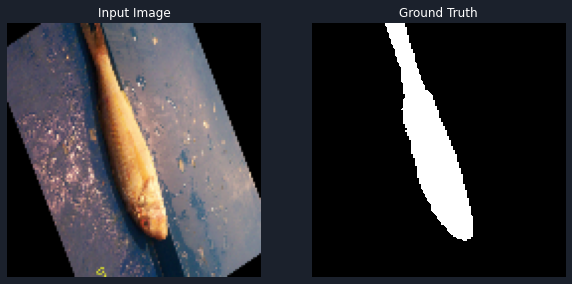

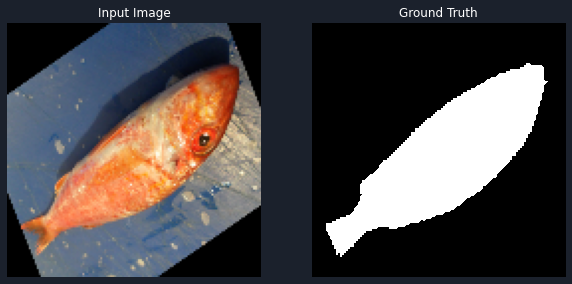

In [ ]:
for image, mask in train.take(2):
  sample_image, sample_mask = image, mask
  visualize([sample_image, sample_mask])

## Load Pretrained Model (Optional)

If it is not the first time rnning this notebook and the model has already been trained, this cell is run to prevent retraining the model. A .h5 file which contains a pretrained model is loaded.

In [ ]:
model_path = '/content/drive/MyDrive/School/Masters/F2021/CP8307/Final Project/U-Net_YV_Fish/U-Net_YV_Fish_11_17_2021_18_27_58.h5'
model = tf.keras.models.load_model(model_path)

In [ ]:
# Set parameters that loaded model requires

BATCH_SIZE = 64
BUFFER_SIZE = 1000
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

## Define Model

In this section, the U-Net architecture is implemented in TensorFlow using the Keras API to construct each layer.

https://www.semanticscholar.org/paper/U-Net%3A-Convolutional-Networks-for-Biomedical-Image-Ronneberger-Fischer/6364fdaa0a0eccd823a779fcdd489173f938e91a

### Define Convolutional Unit

First, a function for defining the convolutional unit is defined. Since this component is used often in the network, it was decided to parameterize it such that the number of filters and kernel size can be adjusted if needed. 

The convolutional unit uses the "he_normal" kernel initializer on two consecutive convolutional layers with "same" padding, followed by a ReLU (Rectified Linear Unit) activation layer.

The kernel initializer is a parameter that defines the distribution of the initial weights of the network. According to the U-Net paper, this network used a normal distribution with standard deviation $\sigma=\sqrt{2/N}$, which aligns with the definition of the "he_normal" initializer from TensorFlow.

In [ ]:
def conv2d_unit(input, num_filters, kernel_size=(3,3)):
  # input is an input TENSOR of size (128,128,3) for example
  # num_filters will start off at 64,128,256,512
  # kernel size is (3,3)
  # He_normal weight initializer and ReLU activation is used as per paper..
  # 'same' padding used to prevent black border from zero padding.
  x = input 
  x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=kernel_size, kernel_initializer = 'he_normal', padding='same')(x)
  x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=kernel_size, kernel_initializer = 'he_normal', padding='same')(x)
  x = tf.keras.layers.Activation('relu')(x)
  return x

### Define Encoder

The encoder unit was designed to create two convolutional layers followed by a max pooling operation with a 2x2 kernel. Both convolutional layers along with their ReLU activations are created using the previously defined conv2d_unit function. Finally, the max pooling layer is manually added. 

This function contains two outputs, f, and p, because both forward convolutions and pooled outputs are needed for the skip connections later on in the network.

In [ ]:
def encoder_unit(input, num_filters, pool_size=(2,2)):
  # Construct the entire unit for one block of the encoder
  # two conv layers + relu - from conv2d_unit
  # Max pooling with (2,2) kernel.

  # Create two convolution layers + ReLU activation with num_filter filters.
  f = conv2d_unit(input, num_filters=num_filters)

  # Pooling layer with fixed 2x2 kernel.
  p = tf.keras.layers.MaxPooling2D(pool_size=(2,2))(f)

  # Saving both f (forward convolution) and p (pooled output) for the 
  # skip connections later on

  return f, p

The first half of the "U" shape in the network architecture is defined using the ***encoder*** function. This function creates four encoder units, one for each downsampling stage of the network. Skip connections are saved along with the forward convolutions so that they can be used as inputs to the decoder network. Each encoder unit doubles the number of filters, effectively downsampling the image by a factor of two each time.

In [ ]:
def encoder(input):
  # Construct the entire encoder as a combination of encoder units
  # f1, f2, f3, f4 are used for skip connections later on
  # p4 is fed into the bottleneck

  f1, p1 = encoder_unit(input,num_filters=64)
  f2, p2 = encoder_unit(p1,num_filters=128)
  f3, p3 = encoder_unit(p2,num_filters=256)
  f4, p4 = encoder_unit(p3,num_filters=512)

  return p4, (f1, f2, f3, f4)

### Define Bottleneck

After the image has passed through the four encoding stages, it goes through a bottleneck layer which consists of another convolutional unit with 1024 filters. The bottleneck layer forces the network to learn a compressed represenation of the image.

In [ ]:
def bottleneck(input):
  #take p4, 3x3 conv with 1024 filters
  bn = conv2d_unit(input, num_filters=1024)
  return bn

### Define Decoder

Now that the input image has been encoded (downsampled), it passes through a decoder network to extract features from the image. In other words, each decoder stage will perform an upsampling operation.

Each decoder unit is up-convoluted or "deconvoluted" by a 3x3 kernel of stride 2x2. The decoder units utilize skip connections, which have been proven to increase the performance of the network. 

The skip connections consist of the pooling output from the encoder stage that were saved before. A concatenation of the up-convoluted result with the pooled result are then passed through a convolution unit.

In [ ]:
def decoder_unit(input, f_out, num_filters=64, kernel_size=(3,3), strides=(2,2)):
  # Constuct the entire unit for one block of the decoder
  # Up-convolute input by 2x2
  # Concatenate up-convoluted resultwith equivalent from convolution on the descend
  # Deconvolution

  up_conv = tf.keras.layers.Conv2DTranspose(num_filters, kernel_size, strides=strides, padding='same')(input)
  b = tf.keras.layers.concatenate([up_conv, f_out])
  b = conv2d_unit(b, num_filters=num_filters)

  return b


The full decoder includes four decoder units with 512, 256, 128, and 64 filters, respectively, followed by a 1x1 convolution with a softmax activation.

A 1x1 convolution is a convolutional layer of size 1x1xN, where N represents the number of channels. These convolutions are used to change the dimensionality of the input. In this scenario, the filter is 1x1x2, because the final output should have two values. 

A softmax activation is used on the output layer to take the highest probability of each class. In this case, the classes are the background, and the fish.

Therefore, each pixel will have two probabiliities, one for the background class, and one for the fish class. The softmax layer takes the class with the highest probability.



In [ ]:
def decoder(input, f_convs, out_ch):
  # Construct the entire decoder as a combination of decoder units
  # "input" is the output of the bottleneck (bn)
  # unwrap tuple of ouputs from encoder side
  f1, f2, f3, f4 = f_convs

  # decoder chain
  b4 = decoder_unit(input, f4, num_filters=512)
  b3 = decoder_unit(b4, f3, num_filters=256)
  b2 = decoder_unit(b3, f2, num_filters=128)
  b1 = decoder_unit(b2, f1, num_filters=64)

  # 1x1 convolution with "output_ch" number of filters to make output appropriate size
  # softmax typically used at outputs
  outputs = tf.keras.layers.Conv2D(filters=out_ch, kernel_size=(1, 1), activation='softmax')(b1)

  return outputs

### Define U-Net


After constructing the encoder, bottleneck, and decoder, the full U-Net is constructed with the ***unet()*** function.

As per the U-Net paper, the network is expected to input a 128x128 image.
The images were reshaped to 128x128x3 in an earlier stage.

The scope of this project is to perform semantic segmentation. That is, to detect which pixels in the image represent the fish, and which pixels in the image represent anything else (background). This leaves two output classes; the background and the fish.

The goal of the model is to predict which pixels are part of the background (class 0) and which pixels are fish (class 1). Therefore, the number of output channels of the decoder are set to 2.

In [ ]:
def unet():
  out_ch = 2
  inp = tf.keras.layers.Input(shape=(128, 128, 3))
  encoder_out, f_convs = encoder(inp)
  bottleneck_out = bottleneck(encoder_out)
  decoder_out = decoder(bottleneck_out, f_convs, out_ch=out_ch)
  model = tf.keras.Model(inputs=inp, outputs=decoder_out)
  return model

In [ ]:
# Construct the U-Net model
model = unet()

# Display summary of the model, including dimensions and number of parameters.
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 128, 128, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

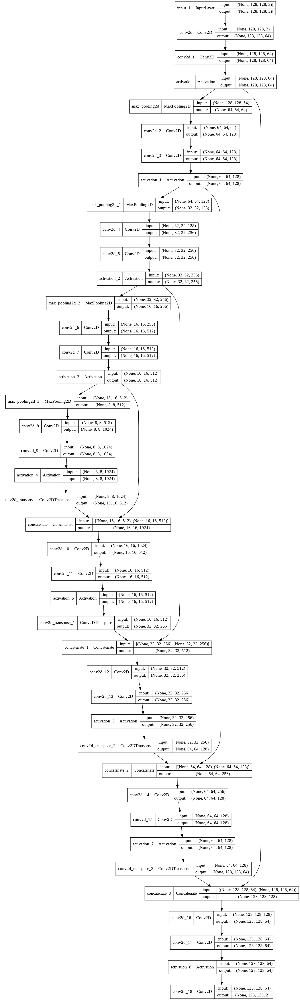

In [ ]:
# Plot model map
plot_model(model, show_shapes=True)

## Compile and Train U-Net

After the model is created, the next step is to define the loss function and metrics using the ***compile()*** function.

The Adam optimizer was used to train this network along with the sparse categorical cross entropy loss function. 

Adam (Adaptive Moment Estimation) allows for adaptive learning rates when minimizing the loss, while the sparse categorical cross entropy loss function takes assigns the class with the highest probability to the pixel.

https://www.tensorflow.org/api_docs/python/tf/keras/Model

In [ ]:
# configure the optimizer, loss and metrics for training
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


TensorBoard was used to model the model accuracy for the training and validation (test) sets.

https://www.tensorflow.org/tensorboard

In [ ]:
# configure TensorBoard callback
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

# configure early stopping
# This callback will stop the training when there is no improvement in
# the loss for three consecutive epochs.
#callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

Due to memory limitations, batches of the data were fed into the model during training. A batch size of 64 was used, with a buffer size of 1000. 

In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

Next, the model was trained for 10 epochs.


In [ ]:
# configure the training parameters and train the model
TRAIN_LENGTH = len(df_train)
EPOCHS = 10
VAL_SUBSPLITS = 5
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = len(df_test)//BATCH_SIZE//VAL_SUBSPLITS

model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[tensorboard_callback])

Epoch 1/10
112/112 [==============================] - 2129s 16s/step - loss: 4.0214 - accuracy: 0.8824 - val_loss: 0.1079 - val_accuracy: 0.9664
Epoch 2/10
112/112 [==============================] - 192s 2s/step - loss: 0.1112 - accuracy: 0.9648 - val_loss: 0.1021 - val_accuracy: 0.9676
Epoch 3/10
112/112 [==============================] - 182s 2s/step - loss: 0.1044 - accuracy: 0.9662 - val_loss: 0.0949 - val_accuracy: 0.9681
Epoch 4/10
112/112 [==============================] - 182s 2s/step - loss: 0.0983 - accuracy: 0.9673 - val_loss: 0.0896 - val_accuracy: 0.9694
Epoch 5/10
112/112 [==============================] - 181s 2s/step - loss: 0.0837 - accuracy: 0.9713 - val_loss: 0.0849 - val_accuracy: 0.9717
Epoch 6/10
112/112 [==============================] - 183s 2s/step - loss: 0.0723 - accuracy: 0.9746 - val_loss: 0.0740 - val_accuracy: 0.9744
Epoch 7/10
112/112 [==============================] - 183s 2s/step - loss: 0.0692 - accuracy: 0.9757 - val_loss: 0.0583 - val_accuracy: 0.97

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

TensorBoard logs are downloaded for future use.

In [ ]:
!zip -r /content/logs.zip /content/logs

from google.colab import files
files.download("/content/logs.zip")


  adding: content/logs/ (stored 0%)
  adding: content/logs/20211117-172452/ (stored 0%)
  adding: content/logs/20211117-172452/train/ (stored 0%)
  adding: content/logs/20211117-172452/train/events.out.tfevents.1637169892.7891f460d1f3.74.0.v2 (deflated 70%)
  adding: content/logs/20211117-172452/validation/ (stored 0%)
  adding: content/logs/20211117-172452/validation/events.out.tfevents.1637171871.7891f460d1f3.74.1.v2 (deflated 72%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Save Model

The model is saved as a .h5 file with the current date and time appended in the name.


In [ ]:
# SAVE MODEL
from datetime import datetime

CT = datetime.now()
CT = CT.strftime("%m_%d_%Y_%H_%M_%S")

In [ ]:
# save full model
filename = f"U-Net_YV_Fish_{CT}"
fullpath = '/content/drive/MyDrive/School/Masters/F2021/CP8307/Final Project/U-Net_YV_Fish/' + filename
model.save(fullpath)

INFO:tensorflow:Assets written to: /content/drive/MyDrive/School/Masters/F2021/CP8307/Final Project/U-Net_YV_Fish/U-Net_YV_Fish_11_17_2021_18_27_58/assets


In [ ]:
# save full model as .h5 (HDF5 standard)
filename = f"U-Net_YV_Fish_{CT}.h5"
fullpath = '/content/drive/MyDrive/School/Masters/F2021/CP8307/Final Project/U-Net_YV_Fish/' + filename
model.save(fullpath)

## Predictions

Once the model has been trained, predictions should be made to verify the quality of the model. A sample image, mask pair were extracted from the test set (data that the model has never seen) to generate predictions on.

Functions used to make predictions and generate the segmentation mask were sourced from TensorFlow's image segmentation tutorial.

https://www.tensorflow.org/tutorials/images/segmentation

### Define Prediction Functions

In [ ]:
# https://www.tensorflow.org/tutorials/images/segmentation
def create_mask(pred_mask):
  # Output final mask by taking channel with highest probability
  pred_mask = tf.argmax(pred_mask, axis=-1) # taking channel with highest probability
  pred_mask = pred_mask[..., tf.newaxis] # add new dimension


  return pred_mask[0].numpy()

# https://www.tensorflow.org/tutorials/images/segmentation
def make_predictions(image):
  # predicts mask based on a single image-mask pair.
  # Ground truth mask inputted for visualization purposes.
  image = np.reshape(image,(1, image.shape[0], image.shape[1], image.shape[2]))
  pred_mask = model.predict(image)
  pred_mask = create_mask(pred_mask)


  return pred_mask 

# https://www.tensorflow.org/tutorials/images/segmentation
def show_predictions(sample_image, sample_mask):
    # predicts and displays mask based on a single image-mask pair.
    # Ground truth mask inputted for visualization purposes.
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = create_mask(pred_mask)
    visualize([sample_image, sample_mask, pred_mask])

In [ ]:
integer_slider = 20 # sample image index
for images, masks in test_dataset.take(integer_slider):
    for img, mask in zip(images, masks):
        sample_image = img
        sample_mask = mask
        break

### Show Sample Prediction

The input image, ground truth mask, and predicted mask are displayed to verify the quality of results.

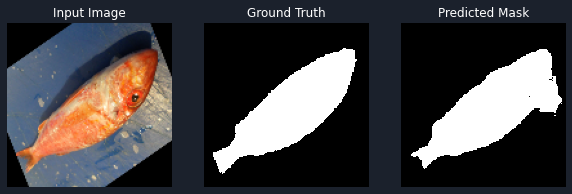

In [ ]:
show_predictions(sample_image, sample_mask)

### Retrieve Ground Truth and Predict Masks for all Test Data

The function ***get_ground_truth_test()*** was implemented to retrieve the images and masks from the test set.

In [ ]:
def get_ground_truth_test():
  ds = test_dataset.unbatch()
  ds = ds.batch(len(df_test))
  
  y_true_images = []
  y_true_masks = []

  for image, mask in ds.take(1):
    y_true_masks = mask.numpy()
    y_true_images = image.numpy()
  
  
  return y_true_images, y_true_masks

In [ ]:
# get the ground truth image, mask pairs from the test set
y_true_images, y_true_masks = get_ground_truth_test()

In [ ]:
# feed the test set to the model to get the predicted masks
results = model.predict(test_dataset)
results.shape

(1800, 128, 128, 2)

In [ ]:
# take argmax of first three dimensions.
# we are left with a 1800 samples of 128x128 images
results = np.argmax(results, axis=3)
results.shape

(1800, 128, 128)

In [ ]:
# add new dimension (1 channel image)
results = results[..., tf.newaxis]
results.shape

(1800, 128, 128, 1)

### Define Evaluation Metrics: IOU and Dice Score

While the predicted segmentation mask of the example earlier appeared to be accurate, there needs to be a quantitative method of evaluating the performance of the model.

The Intersection-Over-Union (IOU) and Dice Score are two commonly used metrics for evaluation semantic segmentation models.

This section defines functions that were used to generate the IOU and Dice Score for each class across all testing examples.

In [ ]:
# Based on notebook from Advanced Computer Vision with TensorFlow
def compute_iou(y_true, y_pred, i=1):
  # value of 1 corresponds to the fish. 0 corresponds to the background.
  eps = 0.00001 # for smoothing
  intersection = np.sum((y_pred == i) * (y_true == i)) # AND operation to find INTERSECTION
  y_true_area = np.sum((y_true == i))
  y_pred_area = np.sum((y_pred == i))
  union = y_true_area + y_pred_area # OR operation for union
  iou = (intersection + eps) / (union - intersection + eps) # subtract intersection to remove double count


  return round(iou,2)

# Based on notebook from Advanced Computer Vision with TensorFlow
def compute_dice_score(y_true, y_pred, i=1):
  # value of 1 corresponds to the class of the fish. 0 corresponds to the background.
  eps = 0.00001  
  intersection = np.sum((y_pred == i) * (y_true == i))
  y_true_area = np.sum((y_true == i))
  y_pred_area = np.sum((y_pred == i))
  union = y_true_area + y_pred_area
  dice_score =  2 * ((intersection + eps) / (union + eps))


  return round(dice_score,2)

# Based on notebook from Advanced Computer Vision with TensorFlow
def compute_class_metrics(y_true, y_pred, i=1):
  # Compute IOU and Dice Score for Background and Fish classes
  class_iou = []
  class_dice_score = []

  for i in range(i+1):
    iou = compute_iou(y_true, y_pred, i)
    dice_score = compute_dice_score(y_true, y_pred, i)

    class_iou.append(iou)
    class_dice_score.append(dice_score)

  return class_iou, class_dice_score

In [ ]:
class_iou, class_dice_score = compute_class_metrics(y_true_masks, results)
print(f"IOU (background, fish):\n{class_iou}")
print(f"\nDice Score (background, fish):\n{class_dice_score}")

IOU (background, fish):
[0.98, 0.89]

Dice Score (background, fish):
[0.99, 0.94]


The following section is used to view the original image, ground truth mask, and predicted mask for any example from the test set, as well as computing the IOU and Dice Score for the background and fish classes.

In [ ]:
# Input a number between 0 and 1799 to pick an image from the test dataset
integer_slider = 90

# Get the prediction mask
y_pred_mask = make_predictions(y_true_images[integer_slider])  

# Compute the IOU and Dice_Score values for specified example
iou_values, dice_score_values = compute_class_metrics(y_true_masks[integer_slider], y_pred_mask) 

## Visualization

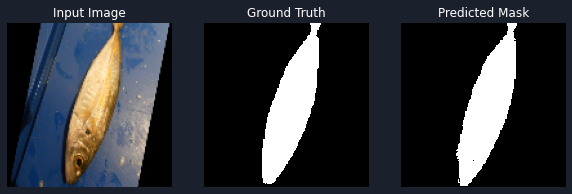

IOU (background, fish):
[0.99, 0.96]

Dice Score (background, fish):
[1.0, 0.98]


In [ ]:
# Final visualization
# Print out IOU and F1 Score (Dice Score) for the background class and fish class.
visualize([y_true_images[integer_slider],y_true_masks[integer_slider],y_pred_mask])
print(f"IOU (background, fish):\n{iou_values}")
print(f"\nDice Score (background, fish):\n{dice_score_values}")

## Predict Subset of Test Set

This section extracts a subset of the test set (first four samples) and generates predictions as well as the IOU and Dice score. The masks for the same images will be generated with traditional segmentation algorithms as well, and the IOU/Dice scores will be compared.

In [ ]:
len(y_true_masks)

1800

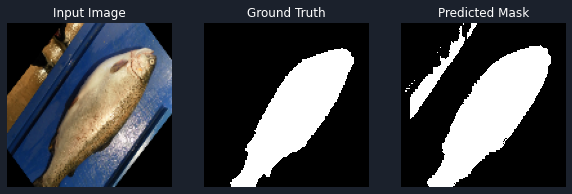

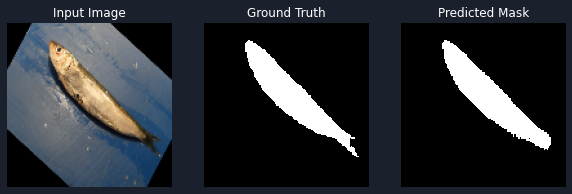

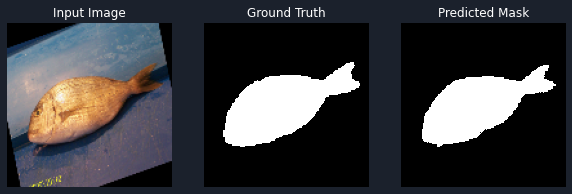

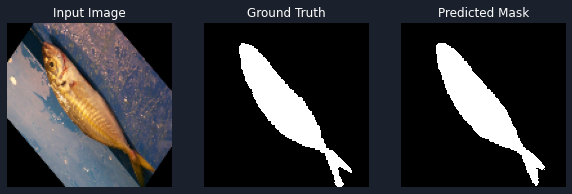

,IOU (Background),IOU (Fish),Dice Score (Background),Dice Score (Fish)
1,0.91,0.80,0.96,0.89
2,0.99,0.92,0.99,0.96
3,0.98,0.92,0.99,0.96
4,0.99,0.94,0.99,0.97


In [ ]:
sub_pred_masks = []
sub_iou_values = []
sub_dice_score_values = []

# indices of sample set of 4 images from testing set
subset_list = [1245, 281, 1305, 1549]

i = 0
for s in subset_list:
  # Get the prediction mask
  sub_pred_mask = make_predictions(y_true_images[s]) 
  sub_pred_masks.append(sub_pred_mask) 

  # Compute the IOU and Dice_Score values for specified example
  iou_values, dice_score_values = compute_class_metrics(y_true_masks[s], sub_pred_masks[i])

  # Append to list to save IOU and Dice score for each test sample in subset.
  sub_iou_values.append(iou_values)
  sub_dice_score_values.append(dice_score_values)

  # Visualize predictions.
  visualize([y_true_images[s], y_true_masks[s], sub_pred_masks[i]])

  i += 1
# Define DataFrame
df = pd.DataFrame()

# Extract IOU and Dice Scores for each class into their own list.
iou_bg = [el[0] for el in sub_iou_values]
iou_fish = [el[1] for el in sub_iou_values]
dice_bg = [el[0] for el in sub_dice_score_values]
dice_fish = [el[1] for el in sub_dice_score_values]

# Assign DataFrame columns.
df["IOU (Background)"] = iou_bg
df["IOU (Fish)"] = iou_fish
df["Dice Score (Background)"] = dice_bg
df["Dice Score (Fish)"] = dice_fish

# increment index of DataFrame
df.index = range(1,len(df)+1)

# Display DataFrame
df

## Predict Random Images

This section provides a function ***random_prediction(n)*** that will show predictions for a random selection of *n* samples from the test set. 

The example below uses n = 3 to view three samples and their respective predictions.

In [ ]:
def random_prediction(n):
  for i in random.sample(range(1, 1800), n):

    # Get the prediction mask
    y_pred_mask = make_predictions(y_true_images[i])  

    # Compute the IOU and Dice_Score values for specified example
    iou_values, dice_score_values = compute_class_metrics(y_true_masks[i], y_pred_mask) 

    # Final visualization
    # Print out IOU and F1 Score (Dice Score) for both classes
    visualize([y_true_images[i],y_true_masks[i],y_pred_mask])
    print(f"IOU (background, fish):\n{iou_values}")
    print(f"\nDice Score (background, fish):\n{dice_score_values}")

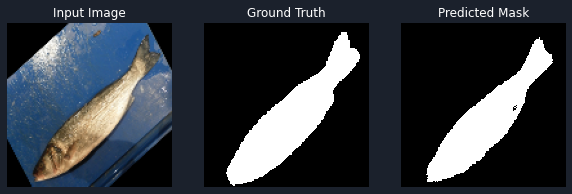

IOU (background, fish):
[0.95, 0.85]

Dice Score (background, fish):
[0.98, 0.92]


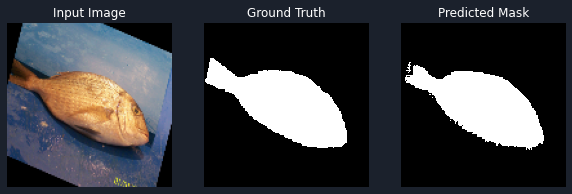

IOU (background, fish):
[0.98, 0.92]

Dice Score (background, fish):
[0.99, 0.96]


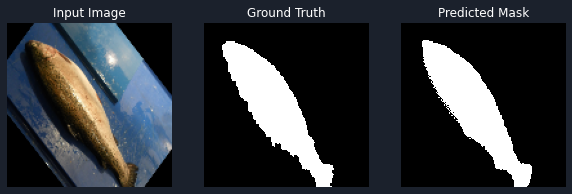

IOU (background, fish):
[0.97, 0.9]

Dice Score (background, fish):
[0.99, 0.95]


In [ ]:
# Input a number (n) between 1 and 1799 to pick that many images from the test dataset.
random_prediction(n=3)

##Export Predicted Masks from Subset

This section was added to generate figures for the final report.

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import os

In [ ]:
len(sub_pred_masks2)

4

In [ ]:
sub_pred_masks2 = []

for mask in sub_pred_masks:
  sub_pred_masks2.append(mask*255)

In [ ]:
!rm -rf unet_masks

In [ ]:
os.mkdir("unet_masks")

In [ ]:
impath = "/content/unet_masks"
count = 1
for mask in sub_pred_masks2:
    name = impath + "/Image" + str(count) + "_2_" + "UNet.png" 
    cv2.imwrite(name, mask)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    count += 1

In [ ]:
# zip
!zip -r /content/unet_masks.zip /content/unet_masks

  adding: content/unet_masks/ (stored 0%)
  adding: content/unet_masks/Image4_2_UNet.png (deflated 3%)
  adding: content/unet_masks/Image1_2_UNet.png (deflated 2%)
  adding: content/unet_masks/Image2_2_UNet.png (deflated 8%)
  adding: content/unet_masks/Image3_2_UNet.png (deflated 17%)


In [ ]:
# download zip file
from google.colab import files
files.download("/content/unet_masks.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>